In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import datetime
import glob
import pandas as pd
import os
from scipy import signal
import DasPrep as dp
# import pyproj
from nptdms import TdmsFile
import DasPrep as idas
import matplotlib.animation as animation
import das_event_manual_pick as das_mp
from scipy import signal
import DasPrep as dp
import post

savefigpath = '/home/wuzm/data/DAS_DL_Dataset/data/xfj/das_event_reorganize_fig/'

save_csv_path = '/home/wuzm/data/DAS_DL_Dataset/DASEventData/phase_picks/'
eq_catalog_file = '/home/wuzm/data/DAS_DL_Dataset/data/xfj/DetectedFinal.dat'

eq_cat = pd.read_csv(eq_catalog_file, delim_whitespace=True)


eq_time = np.array([datetime.datetime.strptime(str(eq_cat['Date'].values[i])+' '+str(eq_cat['Time'].values[i]), '%Y/%m/%d %H:%M:%S.%f') 
       for i in range(len(eq_cat))])

# eq_time = eq_time - datetime.timedelta(seconds=8*3600)   # this catalog was in UTC

lat = eq_cat['Lat.'].values
lon = eq_cat['Lon.'].values
mag = eq_cat['Mag.'].values
dep = eq_cat['Dep.'].values
Coef = eq_cat['Coef.'].values


tdms_dir = "/home/disk/disk02/bluo/xfj_das/"
tdms_file_list = sorted( glob.glob(tdms_dir+'*.tdms'))
for i_tdms_file in range(0,len(tdms_file_list),2): 

       start_time = datetime.datetime.strptime(' '.join( tdms_file_list[i_tdms_file].split('_')[-2:]), '%Y%m%d %H%M%S.%f.tdms')
       if start_time > datetime.datetime(year=2022,month=4,day=28,hour = 14,minute = 32,second =40):
              print(start_time)

              data =np.concatenate( [dp.read_das(tdms_file_list[i_tdms_file]) , dp.read_das(tdms_file_list[i_tdms_file+1]) ], axis=1)

              nt = data.shape[1]
              nch = data.shape[0]
              nw = 'xfj'
              sta = 'DAS'
              dt = dp.read_das( tdms_file_list[i_tdms_file], metadata = True)['dt']
              # print(nt)
              ch1 = 0 
              ch2 = nch

              # down sample and save raw data 
              # data_raw_d = signal.decimate(data_raw, 3, axis=-1).astype('float32')
              # data process
              data_p = dp.das_preprocess(data)
              # f1, f2 = 15, 35
              f1, f2 = 1,  20
              data = dp.bandpass(data_p * signal.windows.tukey(data_p.shape[1], alpha=0.2), dt, fl=f1, fh=f2)
              # data = dp.lowpass(data_p * signal.windows.tukey(data_p.shape[1], alpha=0.2), dt,  fh=10)
              # data = data_p
              print(data.shape)

              # plot hot map to find the arrive time
              # https://stackoverflow.com/questions/39079562/matplotlib-animation-vertical-cursor-line-through-subplots
              # fig, ax = plt.subplots(figsize=[8,7])

              clim = data.std()

              save_path = '/home/disk/disk01/wzm/DAS_DL_Dataset/data/xfj/xfj_tdms_raw_diting/'
              save_name = save_path+ tdms_file_list[i_tdms_file].split('/')[-1][:-5]+'.txt' 
              diting_event = pd.read_csv(save_name, sep='\s+',header=None, names=['sta','chn','P0','P1','S0','S1'])

              fig = plt.figure(figsize=[8,8])
              plt.imshow(data[:, :].T, aspect='auto', cmap ='seismic', 
                     vmin = -clim, vmax = clim,
                     extent=[0,data.shape[0], data.shape[1]*dt, 0])
              plt.xlabel('Channel')
              plt.ylabel('Time (s)')
              p_time = np.array([datetime.datetime.strptime(diting_event["P0"][i], '%Y-%m-%dT%H:%M:%S.%fZ').__sub__(start_time)
                     for i in range(len(diting_event))])
              s_time = np.array([datetime.datetime.strptime(diting_event["S0"][i], '%Y-%m-%dT%H:%M:%S.%fZ').__sub__(start_time)
                     for i in range(len(diting_event))])
              p_s = np.array([i.seconds + i.microseconds /1000000. for i in p_time])
              s_s = np.array([i.seconds + i.microseconds /1000000. for i in s_time])

              p_c = np.array([1 if i >0.6 else 0 for i in diting_event['P1']])
              s_c = np.array([1 if i >0.6 else 0 for i in diting_event['S1']])

              print(np.mean(p_s))
              plt.scatter(diting_event["chn"].values,p_s, c="r", s=p_c,label = "P")
              plt.scatter(diting_event["chn"].values,s_s, c="b", s=s_c,label = "S")
              # for i in range(len(p_s)):
              #     if np.abs(p_s[i]-np.mean(p_s)) > 10:
              #        if s_c[i]>0:
              #               print(diting_event['S1'][i])
              #               plt.annotate(diting_event['S1'][i], xy = (diting_event["chn"][i], p_s[i]))
              plt.legend()
              # plt.xlabel("Distance (m)")
              # plt.ylabel("Time (s)")
              # plt.ylim(int(np.mean(s_s)+5),int(np.mean(p_s)-5))
              # plt.ylim(0,38)
              # arglist = ['Date', 'Time', 'Lat.', 'Lon.', 'Mag.', 'Dep.']
              # plt.text(2050, int(np.mean(p_s)), eq_cat.iloc[iev][arglist])
              plt.title("1-20Hz Bandpass")
              plt.show()

              # savefigname = "/home/disk/disk01/wzm/DAS_DL_Dataset/data/xfj/sac_diting_fig" + 'xfj_das_diting_eq_' + str(iev)+ '.png'
              savefigname = "/home/disk/disk01/wzm/DAS_DL_Dataset/data/xfj/sac_diting_fig" + 'xfj_das_diting_eq_' + str(iev)+ '.png'

              fig.savefig(savefigname, dpi=300)


/tmp/ipykernel_1861898/2052818221.py:33: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  eq_cat = pd.read_csv(eq_catalog_file, delim_whitespace=True)


-0.7189805825242719


,#No.,Date,Time,Lat.,Lon.,Dep.,Mag.,Coef.,N(*MAD),Reference
175,2,2022/05/03,05:30:21.081,23.856,114.496,8.0,2.03,0.607,35.6757,2.022043e+13


/home/wuzm/data/DAS_DL_Dataset/data/xfj/das_event_reorganize/xfj_das_re_eq_68.npy
(2944, 24000)
(2944, 8000)
27.776181474480147


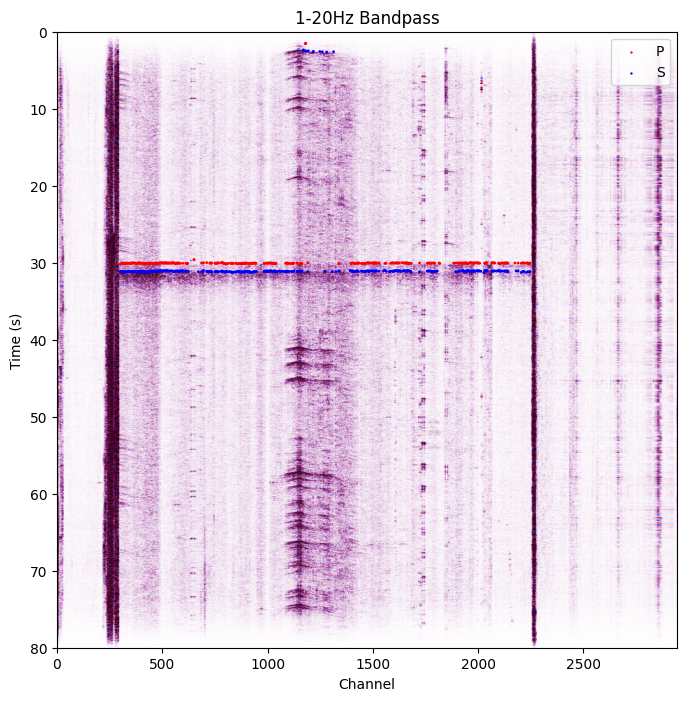

In [85]:
from stonesoup.types.state import GaussianState
from stonesoup.types.hypothesis import SingleHypothesis
from stonesoup.types.track import Track
import numpy as np
from datetime import datetime, timedelta
from stonesoup.types.detection import Detection
from stonesoup.models.measurement.linear import LinearGaussian
from stonesoup.plotter import AnimatedPlotterly
import glob
import pandas as pd
from stonesoup.models.transition.linear import CombinedLinearGaussianTransitionModel, \
                                               ConstantVelocity
def kalman_filter(s_s , s_c , chn_list ,nch):
    s_s_ = np.zeros(nch)
    s_c_ = np.zeros(nch)
    for i in range(len(chn_list.values)):
        s_s_[chn_list[i]] = s_s[i]
        s_c_[chn_list[i]] = s_c[i]
    # kalman_filter(p_s)

    measurement_model = LinearGaussian(
        ndim_state=4,  # Number of state dimensions (position and velocity in 2D)
        mapping=(0, 2),  # Mapping measurement vector index to state index
        noise_covar=np.array([[5, 0],  # Covariance matrix for Gaussian PDF
                            [0, 5]])
        )

    start_time = datetime.now().replace(microsecond=0)
    timesteps = [start_time]
    measurements = []
    n_p = np.mean(s_s)
    for k in range(0, nch):
        timesteps.append(start_time+timedelta(seconds=k)) 
        if k%3 == 0:
            measurement = [[k, s_s_[k]]]
            # print(measurement)
            if s_s_[k]> 0 :
                if np.abs(measurement[0][1] - n_p) < 10 :
                    # print(n_p , measurement[0][1])
                    measurements.append(Detection(measurement,
                                                timestamp=timesteps[k],
                                                measurement_model=measurement_model))
                    n_p = measurement[0][1]

    # plotter = AnimatedPlotterly(timesteps, tail_length=0.3)  
    # plotter.plot_measurements(measurements, [0, 2])
    # plotter.fig

    q_x = 0.05
    q_y = 0.05
    transition_model = CombinedLinearGaussianTransitionModel([ConstantVelocity(q_x),
                                                            ConstantVelocity(q_y)])
    from stonesoup.predictor.kalman import ExtendedKalmanPredictor
    predictor = ExtendedKalmanPredictor(transition_model)

    from stonesoup.updater.kalman import ExtendedKalmanUpdater
    updater = ExtendedKalmanUpdater(measurement_model)
    prior = GaussianState([[0], [1], [ np.mean(s_s)], [0]], np.diag([1.5, 0.5, 1.5, 0.5]), timestamp=start_time)
    track = Track()
    ac_ch_list = []
    hy_list = []
    for measurement in measurements:
        prediction = predictor.predict(prior, timestamp=measurement.timestamp)
        hypothesis = SingleHypothesis(prediction, measurement)  # Group a prediction and measurement
        post = updater.update(hypothesis)
        track.append(post)
        prior = track[-1]
        ac_ch_list.append(hypothesis.measurement_prediction.state_vector.tolist()[0][0] - 1.5)
        hy_list.append(hypothesis.measurement_prediction.state_vector.tolist()[1][0])

    # plotter.plot_tracks(track, [0, 2], uncertainty=False)
    # plotter.fig
    # print(ch_list)
    return np.array( ac_ch_list) , np.array(hy_list)

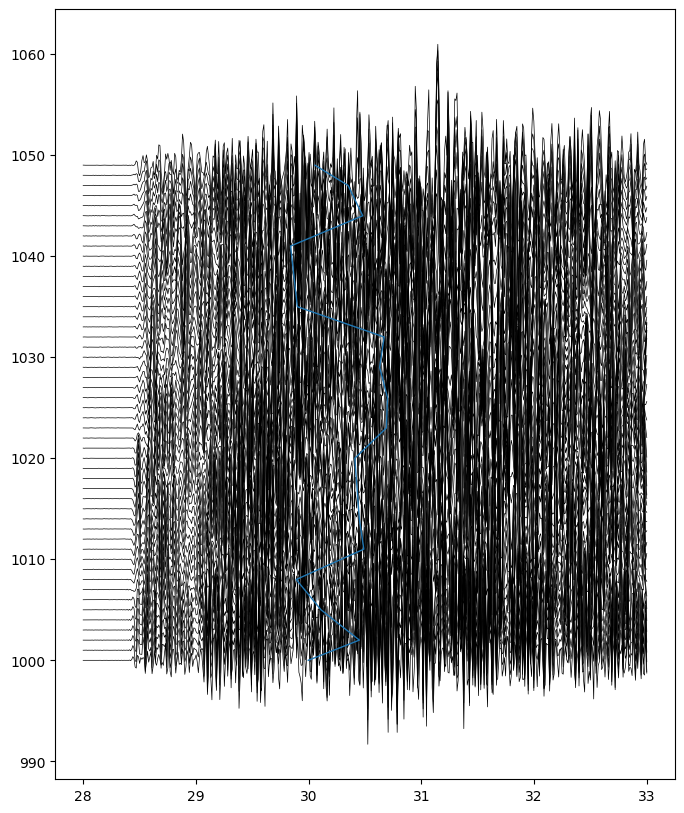

In [7]:
from scipy import interpolate
import post


# ac_ch_list , hy_list = kalman_filter(s_s,s_c,diting_event["chn"] , 2900 )
# 定义需要插值的点
das_ch1 = 1000
das_ch2 = 1050
ch_list = np.arange(das_ch1 , das_ch2 , dtype=np.int16)
# 进行线性插值
p_line=interpolate.interp1d(diting_event["chn"].values,p_s , kind='linear')
p_time_list =p_line(ch_list)
s_line=interpolate.interp1d(diting_event["chn"].values,s_s , kind='linear')
s_time_list =s_line(ch_list)

t1 , t2 = 28,33
data2 = data_raw_d[: , int(fq * t1) : int(fq * (t2)) ]
fig, ax = plt.subplots( figsize=(8, 10))
for i in range(das_ch1 , das_ch2 ):
    ax.plot( np.linspace(t1 ,  t2  , data2.shape[1] ) , data2[i]/1500 + i, 'k', linewidth=0.5)

ax.plot(s_time_list , ch_list , linewidth=1)
# ax.plot(hy_list[a :b ], ac_ch_list[a :b ] , linewidth=1)
# a = np.where(ac_ch_list > das_ch1)[0][0]
# b = np.where(ac_ch_list < das_ch2)[0][-1]
# a ,b 


## Run PhaseNet-DAS

In [ ]:
ngpu = torch.cuda.device_count()
base_cmd = "EQNet/predict.py --model phasenet_das --data_list=/home/disk/disk01/wzm/DAS_DL_Dataset/data/xfj/tdms_flie.txt  --data_path /home/disk/disk02/bluo/xfj_das --result_path /home/disk/disk01/wzm/DAS_DL_Dataset/data/xfj/phasenetdas_raw/  --format=h5  --batch_size 1 --workers 4"

NameError: name 'torch' is not defined

In [ ]:
with open("files.txt", "w") as f:
    f.write(f"data/{event_id}.h5")

if ngpu == 0:
    cmd = f"python {base_cmd} --device cpu"
elif ngpu == 1:
    cmd = f"python {base_cmd}"
else:
    cmd = f"torchrun --nproc_per_node {ngpu} {base_cmd}"

print(cmd)
os.system(cmd)

# Phasenet DAS results

[datetime.datetime(2022, 4, 22, 0, 57, 33, 103000)
 datetime.datetime(2022, 4, 22, 0, 58, 33, 103000)
 datetime.datetime(2022, 4, 22, 0, 59, 36, 212000) ...
 datetime.datetime(2022, 4, 26, 20, 21, 15, 964000)
 datetime.datetime(2022, 4, 26, 20, 22, 15, 964000)
 datetime.datetime(2022, 4, 26, 20, 23, 15, 964000)] 2022-04-28 13:34:53.123000 2022-04-28 13:36:13.123000
/home/disk/disk01/wzm/picks_phasenet_das_raw/IDAS16047_xfj_UTC_20220426_202315.964.csv
文件为空


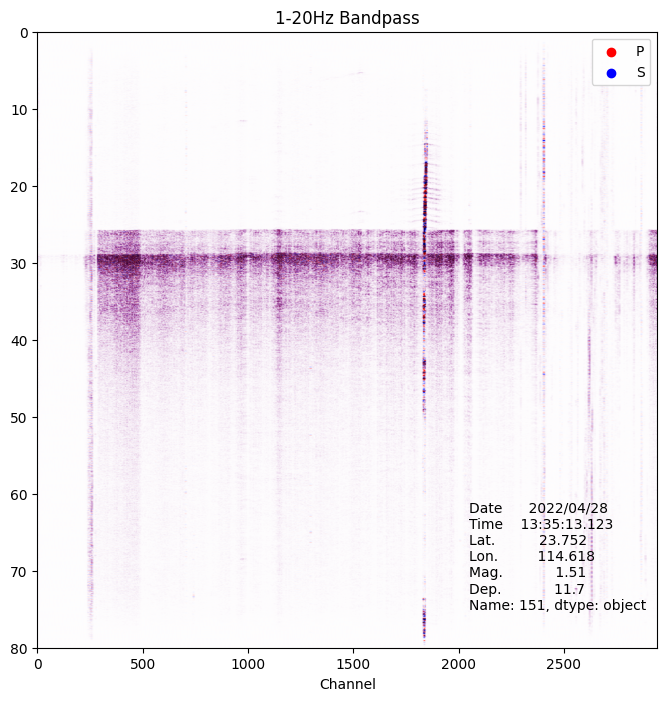

In [ ]:


fig = plt.figure(figsize=[8,8])
plt.imshow(data[:, :].T, aspect='auto', cmap ='seismic', 
           vmin = -clim, vmax = clim,
          extent=[0,data.shape[0], data.shape[1]*dt, 0])
plt.xlabel('Channel')
    
csv_file = glob.glob("/home/disk/disk01/wzm/picks_phasenet_das_raw/*csv")
csv_file.sort()
def get_das_file_time(das_filename):
    das_file_time_str = ' '.join(os.path.splitext(os.path.basename(das_filename))[0].split('_')[-2:])
    return datetime.datetime.strptime(das_file_time_str, '%Y%m%d %H%M%S.%f')

csv_file_time = np.array([get_das_file_time(csv_file[i]) for i in range(len(csv_file))])
ev_time_before = eq_time[iev] - datetime.timedelta(seconds=dt_before)
ev_time_after  = eq_time[iev] + datetime.timedelta(seconds=dt_after)
print(csv_file_time , ev_time_before ,ev_time_after )

ins_start = np.searchsorted(csv_file_time,ev_time_before) - 1
ins_end = np.searchsorted(csv_file_time, ev_time_after)

das_file_time_select = csv_file_time[ins_start:ins_end]
das_file_select = csv_file[ins_start:ins_end]

for icsv in range(len(das_file_select)):
    csv = das_file_select[icsv]
    print(csv)

    if os.path.getsize(csv) == 0:
        print("文件为空")
        continue
    else:
        picks = pd.read_csv(csv)
        delta_time =(ev_time_before.__sub__(das_file_time_select[icsv])).total_seconds()
        print(delta_time)
        color = picks["phase_type"].map({"P": "C0", "S": "C1"})
        plt.scatter(picks["channel_index"].values*10  , picks["phase_index"].values*dt - delta_time , c=color, s=1)
plt.scatter([], [], c="r", label="P")
plt.scatter([], [], c="b", label="S")


plt.legend()

arglist = ['Date', 'Time', 'Lat.', 'Lon.', 'Mag.', 'Dep.']
plt.text(2050, 75, eq_cat.iloc[iev][arglist])
plt.title("1-20Hz Bandpass")
plt.show()

savefigname = "/home/disk/disk01/wzm/DAS_DL_Dataset/data/xfj/sac_phasenetdas_fig/" + 'xfj_das_diting_eq_' + str(iev)+ '.png'
fig.savefig(savefigname, dpi=300)

# phasenet results

['/home/disk/disk01/wzm/DAS_DL_Dataset/data/xfj/phasenet_results/results_SAC-2022-05-08T06']
556.002


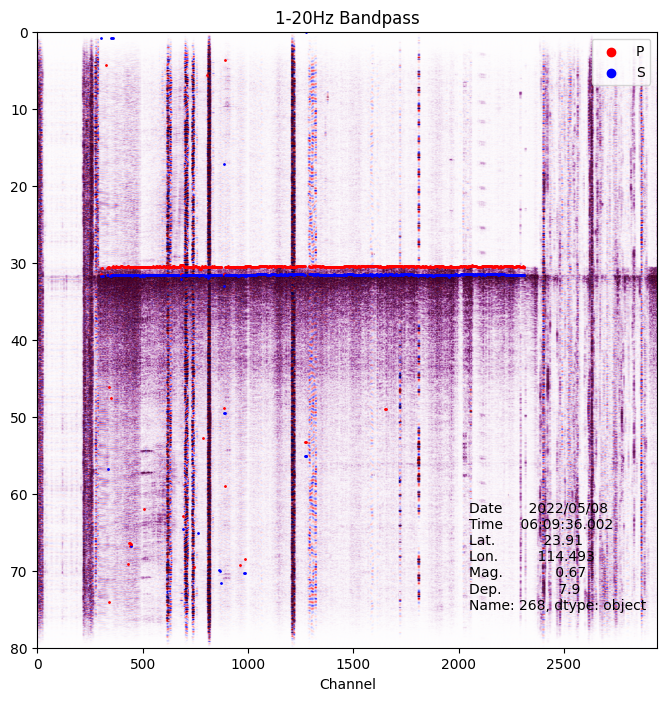

In [23]:


fig = plt.figure(figsize=[8,8])
plt.imshow(data[:, :].T, aspect='auto', cmap ='seismic', 
           vmin = -clim, vmax = clim,
          extent=[0,data.shape[0], data.shape[1]*dt, 0])
plt.xlabel('Channel')
    
csv_file = glob.glob("/home/disk/disk01/wzm/DAS_DL_Dataset/data/xfj/phasenet_results/*")
csv_file.sort()
# print(csv_file)
def get_das_file_time(das_filename):
    das_file_time_str = ' '.join(os.path.splitext(os.path.basename(das_filename))[0].split('_')[-1:])
    return datetime.datetime.strptime(das_file_time_str, 'SAC-%Y-%m-%dT%H')
csv_file_time = np.array([get_das_file_time(csv_file[i]) for i in range(len(csv_file))])
ev_time_before = eq_time[iev] - datetime.timedelta(seconds=dt_before)
ev_time_after  = eq_time[iev] + datetime.timedelta(seconds=dt_after)
# print(csv_file_time , ev_time_before ,ev_time_after )

ins_start = np.searchsorted(csv_file_time,ev_time_before) - 1
ins_end = np.searchsorted(csv_file_time, ev_time_after)

das_file_time_select = csv_file_time[ins_start:ins_end]
das_file_select = csv_file[ins_start:ins_end]
print(das_file_select)
for icsv in range(len(das_file_select)):
    csv = das_file_select[icsv] + "/picks.csv"
    # print(csv)

    if os.path.getsize(csv) == 0:
        print("文件为空")
        continue
    else:
        picks = pd.read_csv(csv)
        delta_time =(ev_time_before.__sub__(das_file_time_select[icsv])).total_seconds()
        # file_name,begin_time,station_id,phase_index,phase_time,phase_score,phase_type
        print(delta_time)
        for i,pt_s in enumerate(picks["phase_time"]):
            pt = datetime.datetime.strptime(pt_s, '%Y-%m-%dT%H:%M:%S.%f')
            if (pt< ev_time_after )and (pt > ev_time_before):
                color = "r" if picks["phase_type"][i] == "P" else "b"
                plt.scatter( int (picks["file_name"][i].split('.')[2] )+  300 , pt.__sub__(ev_time_before).total_seconds() , c=color, s=1)

        
        
plt.scatter([], [], c="r", label="P")
plt.scatter([], [], c="b", label="S")


plt.legend()

arglist = ['Date', 'Time', 'Lat.', 'Lon.', 'Mag.', 'Dep.']
plt.text(2050, 75, eq_cat.iloc[iev][arglist])
plt.title("1-20Hz Bandpass")
plt.show()

savefigname = "/home/disk/disk01/wzm/DAS_DL_Dataset/data/xfj/sac_phasenet_fig/" + 'xfj_das_diting_eq_' + str(iev)+ '.png'
fig.savefig(savefigname, dpi=300)

# Post-Processing

In [ ]:
from stonesoup.types.state import GaussianState
from stonesoup.types.hypothesis import SingleHypothesis
from stonesoup.types.track import Track
import numpy as np
from datetime import datetime, timedelta
from stonesoup.types.detection import Detection
from stonesoup.models.measurement.linear import LinearGaussian
from stonesoup.plotter import AnimatedPlotterly
import glob
import pandas as pd
from stonesoup.models.transition.linear import CombinedLinearGaussianTransitionModel, \
                                               ConstantVelocity
def kalman_filter(s_s , s_c , chn_list ,nch):
    s_s_ = np.zeros(2900)
    s_c_ = np.zeros(2900)
    for i in range(len(chn_list.values)):
        s_s_[chn_list[i]] = s_s[i]
        s_c_[chn_list[i]] = s_c[i]
    # kalman_filter(p_s)

    measurement_model = LinearGaussian(
        ndim_state=4,  # Number of state dimensions (position and velocity in 2D)
        mapping=(0, 2),  # Mapping measurement vector index to state index
        noise_covar=np.array([[5, 0],  # Covariance matrix for Gaussian PDF
                            [0, 5]])
        )

    start_time = datetime.now().replace(microsecond=0)
    timesteps = [start_time]
    measurements = []
    n_p = np.mean(s_s)
    for k in range(0, nch):
        timesteps.append(start_time+timedelta(seconds=k)) 
        if k%3 == 0:
            measurement = [[k, s_s_[k]]]
            # print(measurement)
            if s_s_[k]> 0 :
                if np.abs(measurement[0][1] - n_p) < 10 :
                    # print(n_p , measurement[0][1])
                    measurements.append(Detection(measurement,
                                                timestamp=timesteps[k-1000],
                                                measurement_model=measurement_model))
                    n_p = measurement[0][1]

    # plotter = AnimatedPlotterly(timesteps, tail_length=0.3)  
    # plotter.plot_measurements(measurements, [0, 2])
    # plotter.fig

    q_x = 0.05
    q_y = 0.05
    transition_model = CombinedLinearGaussianTransitionModel([ConstantVelocity(q_x),
                                                            ConstantVelocity(q_y)])
    from stonesoup.predictor.kalman import ExtendedKalmanPredictor
    predictor = ExtendedKalmanPredictor(transition_model)

    from stonesoup.updater.kalman import ExtendedKalmanUpdater
    updater = ExtendedKalmanUpdater(measurement_model)
    prior = GaussianState([[1002,], [1], [ np.float64(31.11)], [0]], np.diag([1.5, 0.5, 1.5, 0.5]), timestamp=start_time)
    track = Track()
    list = []
    for measurement in measurements:
        prediction = predictor.predict(prior, timestamp=measurement.timestamp)
        hypothesis = SingleHypothesis(prediction, measurement)  # Group a prediction and measurement
        post = updater.update(hypothesis)
        track.append(post)
        prior = track[-1]
        list.append(hypothesis.measurement_prediction.state_vector.tolist())
    # plotter.plot_tracks(track, [0, 2], uncertainty=False)
    # plotter.fig
    return list


def simple_weighted(predict):
    return predict
    


# prior = GaussianState([[0], [1], [0], [1]], np.diag([1.5, 0.5, 1.5, 0.5]), timestamp=start_time)
iev = 68
diting_event = pd.read_csv("/home/wuzm/data/DAS_DL_Dataset/data/xfj/sac_diting/xfj_das_re_eq_" + str( iev ) + 
                           ".xfj.DAS._P_S.txt" , sep='\s+',header=None, names=['sta','chn','P0','P1','S0','S1'])
start_time = eq_time[iev]
# fig = plt.figure(figsize=[8,8])
# plt.imshow(data[:, :].T, aspect='auto', cmap ='seismic', 
#            vmin = -clim, vmax = clim,
#           extent=[0,data.shape[0], data.shape[1]*dt, 0])
# plt.xlabel('Channel')
# plt.ylabel('Time (s)')
p_time = np.array([datetime.strptime(diting_event["P0"][i], '%Y-%m-%dT%H:%M:%S.%fZ').__sub__(start_time)
       for i in range(len(diting_event))])
s_time = np.array([datetime.strptime(diting_event["S0"][i], '%Y-%m-%dT%H:%M:%S.%fZ').__sub__(start_time)
       for i in range(len(diting_event))])
p_s = np.array([i.seconds + i.microseconds /1000000. for i in p_time])
s_s = np.array([i.seconds + i.microseconds /1000000. for i in s_time])

p_c = np.array([1 if i >0.6 else 0 for i in diting_event['P1']])
s_c = np.array([1 if i >0.6 else 0 for i in diting_event['S1']])

s_s_ = np.zeros(2900)
s_c_ = np.zeros(2900)
for i in range(len(diting_event["chn"].values)):
    s_s_[diting_event["chn"].values[i]] = s_s[i]
    s_c_[diting_event["chn"].values[i]] = s_c[i]
# kalman_filter(p_s)

measurement_model = LinearGaussian(
    ndim_state=4,  # Number of state dimensions (position and velocity in 2D)
    mapping=(0, 2),  # Mapping measurement vector index to state index
    noise_covar=np.array([[5, 0],  # Covariance matrix for Gaussian PDF
                          [0, 5]])
    )

start_time = datetime.now().replace(microsecond=0)
timesteps = [start_time]
measurements = []
n_p = np.mean(s_s)
for k in range(1000, 1200 + 1):
    timesteps.append(start_time+timedelta(seconds=k)) 
    if k%3 == 0:
        measurement = [[k, s_s_[k]]]
        # print(measurement)
        if s_s_[k]> 0 :
            if np.abs(measurement[0][1] - n_p) < 10 :
                # print(n_p , measurement[0][1])
                measurements.append(Detection(measurement,
                                            timestamp=timesteps[k-1000],
                                            measurement_model=measurement_model))
                n_p = measurement[0][1]

plotter = AnimatedPlotterly(timesteps, tail_length=0.3)  
plotter.plot_measurements(measurements, [0, 2])
plotter.fig


# print(np.mean(p_s))
# plt.scatter(diting_event["chn"].values,p_s, c="r", s=p_c,label = "P")
# plt.scatter(diting_event["chn"].values,s_s, c="b", s=s_c,label = "S")
# # for i in range(len(p_s)):
# #     if np.abs(p_s[i]-np.mean(p_s)) > 10:
# #        if s_c[i]>0:
# #               print(diting_event['S1'][i])
# #               plt.annotate(diting_event['S1'][i], xy = (diting_event["chn"][i], p_s[i]))
# plt.legend()
# # plt.xlabel("Distance (m)")
# # plt.ylabel("Time (s)")
# # plt.ylim(int(np.mean(s_s)+5),int(np.mean(p_s)-5))
# # plt.ylim(0,38)
# # arglist = ['Date', 'Time', 'Lat.', 'Lon.', 'Mag.', 'Dep.']
# # plt.text(2050, int(np.mean(p_s)), eq_cat.iloc[iev][arglist])
# plt.title("1-20Hz Bandpass")
# plt.show()

# # # savefigname = "/home/disk/disk01/wzm/DAS_DL_Dataset/data/xfj/sac_diting_fig" + 'xfj_das_diting_eq_' + str(iev)+ '.png'
# # savefigname = "/home/disk/disk01/wzm/DAS_DL_Dataset/data/xfj/sac_diting_fig" + 'xfj_das_diting_eq_' + str(iev)+ '.png'

# # fig.savefig(savefigname, dpi=300)



# from scipy import interpolate

# # 定义需要插值的点
# das_ch1 = 1000
# das_ch2 = 1100
# ch_list = np.arange(das_ch1 , das_ch2 , dtype=np.int16)
# # 进行线性插值
# p_line=interpolate.interp1d(diting_event["chn"].values,p_s , kind='linear')
# p_time_list =p_line(ch_list)
# s_line=interpolate.interp1d(diting_event["chn"].values,s_s , kind='linear')
# s_time_list =s_line(ch_list)

# t1 , t2 = 28,30
# data2 = data_raw_d[: , int(fq * t1) : int(fq * (t2)) ]
# fig, ax = plt.subplots( figsize=(8, 10))
# for i in range(das_ch1 , das_ch2 ):
#     ax.plot( np.linspace(t1 ,  t2  , data2.shape[1] ) , data2[i]/400 + i, 'k', linewidth=0.5)
# ax.plot(s_time_list , ch_list , linewidth=1)


/home/wuzm/anaconda3/envs/ditinglsm/lib/python3.10/site-packages/stonesoup/plotter.py:2353: UserWarning:

Timesteps are not equally spaced, so the passage of time is not linear



In [ ]:
np.diag([1.5, 0.5, 1.5, 0.5])

array([[1.5, 0. , 0. , 0. ],
       [0. , 0.5, 0. , 0. ],
       [0. , 0. , 1.5, 0. ],
       [0. , 0. , 0. , 0.5]])

In [ ]:
q_x = 0.05
q_y = 0.05
transition_model = CombinedLinearGaussianTransitionModel([ConstantVelocity(q_x),
                                                          ConstantVelocity(q_y)])
from stonesoup.predictor.kalman import ExtendedKalmanPredictor
predictor = ExtendedKalmanPredictor(transition_model)

from stonesoup.updater.kalman import ExtendedKalmanUpdater
updater = ExtendedKalmanUpdater(measurement_model)
prior = GaussianState([[1002,], [1], [ np.float64(31.11)], [0]], np.diag([1.5, 0.5, 1.5, 0.5]), timestamp=start_time)
track = Track()
list = []
for measurement in measurements:
    prediction = predictor.predict(prior, timestamp=measurement.timestamp)
    hypothesis = SingleHypothesis(prediction, measurement)  # Group a prediction and measurement
    post = updater.update(hypothesis)
    track.append(post)
    prior = track[-1]
    list.append(hypothesis.measurement_prediction.state_vector.tolist())
plotter.plot_tracks(track, [0, 2], uncertainty=False)
plotter.fig

In [ ]:
measurements

[Detection(
     state_vector=StateVector([[340.  ],
                               [ 30.98]]),
     timestamp=2025-02-25 19:30:19,
     measurement_model=LinearGaussian(
                           ndim_state=4,
                           mapping=(0, 2),
                           noise_covar=CovarianceMatrix([[5, 0],
                                                         [0, 5]]),
                           seed=None),
     metadata={}),
 Detection(
     state_vector=StateVector([[346.  ],
                               [ 31.11]]),
     timestamp=2025-02-25 19:30:21,
     measurement_model=LinearGaussian(
                           ndim_state=4,
                           mapping=(0, 2),
                           noise_covar=CovarianceMatrix([[5, 0],
                                                         [0, 5]]),
                           seed=None),
     metadata={}),
 Detection(
     state_vector=StateVector([[349.  ],
                               [ 31.12]]),
     timestamp

In [ ]:
list

[[[342.0], [31.1]],
 [[342.6486486486487], [31.01891891891892]],
 [[345.7813745460987], [31.068516849703304]],
 [[348.9043141160933], [31.096601252136182]],
 [[352.10850408587976], [31.080748433062652]],
 [[355.39161616525064], [31.060760475369246]],
 [[361.0734448085715], [31.058532699098237]],
 [[365.093954683922], [31.062228870258657]],
 [[368.67950626482764], [31.05934317058728]],
 [[374.9805654075246], [31.06675103953578]],
 [[387.4311318427957], [31.10253421034062]],
 [[390.8740838613344], [31.088510545267358]],
 [[394.0010256538043], [31.090694997016566]],
 [[397.06608459957533], [31.1161350639102]]]